<a href="https://colab.research.google.com/github/Dr-Isam-ALJAWARNEH/ds-project-thematic-maps/blob/main/code/NY_mob_Choropleth.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install folium
!pip install uszipcode
!pip install geopandas
%pip install pygeohash

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.0/57.0 kB 4.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.9/59.9 kB 7.8 MB/s eta 0:00:00
  Created wheel for atomicwrites: filename=atomicwrites-1.4.1-py2.py3-none-any.whl size=6941 sha256=5b50a59d5d09b4195f285b0f8ae3bb88570c5f786bef35d957b7765de8dd2c08
  Stored in directory: /root/.cache/pip/wheels/34/07/0b/33b15f68736109f72ea0bb2499521d87312b932620737447a2
Successfully built atomicwrites
  Preparing metadata (setup.py) ... done
  Created wheel for pygeohash: filename=pygeohash-1.2.0-py2.py3-none-any.whl size=6152 sha256=7b99e7174d055a5a1a7263722b750933d74036a264e0f68da583c0452abbde20
  Stored in directory: /root/.cache/pip/wheels/28/ec/b6/beadf7295a623f528507691fb0d471b50d064ae9bbad420b8f
Successfully built pygeohash


In [2]:
import geopandas as gpd
import numpy as np
import pandas as pd
import pygeohash as gh

from pandas import Series, DataFrame
import plotly.graph_objs as go
from IPython.display import Image
import folium
from folium import IFrame
from folium.plugins import MarkerCluster
from folium import plugins
from datetime import datetime
import datetime as dt
import json
from scipy import stats

import os

In [3]:
'''from google.colab import drive
drive.mount('/content/drive')'''

"from google.colab import drive\ndrive.mount('/content/drive')"

In [3]:
mobility =  gpd.read_file('https://github.com/IsamAljawarneh/datasets/raw/master/data/nyc1.zip')
mobility.describe()

,id,VendorID,lpep_pickup_datetime,Lpep_dropoff_datetime,Store_and_fwd_flag,RateCodeID,Pickup_longitude,Pickup_latitude,Dropoff_longitude,Dropoff_latitude,...,Extra,MTA_tax,Tip_amount,Tolls_amount,Ehail_fee,improvement_surcharge,Total_amount,Payment_type,Trip_type,geometry
count,1445285,1445285,1445285,1445285,1445285,1445285,1445285,1445285,1445285,1445285,...,1445285,1445285,1445285,1445285,1445285,1445285,1445285,1445285,1445285,0
unique,1445285,2,1044823,1043109,2,7,32082,70320,40389,80270,...,11,5,2046,178,1,45,5516,5,3,0
top,0,2,2016-01-01 00:23:27,2016-01-02 00:00:00,N,1,0.0,0.0,0.0,0.0,...,0,0.5,0,0,,0.3,6.8,2,1,NaN
freq,1,1130127,9,196,1439271,1406863,2509,2509,2329,2329,...,672454,1407603,835497,1420913,1445285,1407626,51215,721468,1412368,NaN


In [ ]:
'''mobility =  gpd.read_file('/content/drive/MyDrive/foundation_of_DS/project/Data/nyc1.csv')
mobility.describe()'''

In [4]:
mobility.head()

,id,VendorID,lpep_pickup_datetime,Lpep_dropoff_datetime,Store_and_fwd_flag,RateCodeID,Pickup_longitude,Pickup_latitude,Dropoff_longitude,Dropoff_latitude,...,Extra,MTA_tax,Tip_amount,Tolls_amount,Ehail_fee,improvement_surcharge,Total_amount,Payment_type,Trip_type,geometry
0,0,2,2016-01-01 00:29:24,2016-01-01 00:39:36,N,1,-73.92864227294922,40.68061065673828,-73.92427825927734,40.69804382324219,...,0.5,0.5,1.86,0,,0.3,11.16,1,1,None
1,1,2,2016-01-01 00:19:39,2016-01-01 00:39:18,N,1,-73.95267486572266,40.723175048828125,-73.92391967773438,40.76137924194336,...,0.5,0.5,0,0,,0.3,16.8,2,1,None
2,2,2,2016-01-01 00:19:33,2016-01-01 00:39:48,N,1,-73.97161102294922,40.67610549926758,-74.0131607055664,40.64607238769531,...,0.5,0.5,4.45,0,,0.3,22.25,1,1,None
3,3,2,2016-01-01 00:22:12,2016-01-01 00:38:32,N,1,-73.989501953125,40.669578552246094,-74.00064849853516,40.68903350830078,...,0.5,0.5,0,0,,0.3,14.8,2,1,None
4,4,2,2016-01-01 00:24:01,2016-01-01 00:39:22,N,1,-73.96472930908203,40.68285369873047,-73.94071960449219,40.66301345825195,...,0.5,0.5,0,0,,0.3,13.3,2,1,None


break pickup time down into smaller components

In [5]:
time = pd.to_datetime(mobility['lpep_pickup_datetime'])

mobility['pday'] = time.dt.day
mobility['phour'] = time.dt.hour
mobility['pmonth'] = time.dt.month

mobility[0:5]

,id,VendorID,lpep_pickup_datetime,Lpep_dropoff_datetime,Store_and_fwd_flag,RateCodeID,Pickup_longitude,Pickup_latitude,Dropoff_longitude,Dropoff_latitude,...,Tolls_amount,Ehail_fee,improvement_surcharge,Total_amount,Payment_type,Trip_type,geometry,pday,phour,pmonth
0,0,2,2016-01-01 00:29:24,2016-01-01 00:39:36,N,1,-73.92864227294922,40.68061065673828,-73.92427825927734,40.69804382324219,...,0,,0.3,11.16,1,1,None,1,0,1
1,1,2,2016-01-01 00:19:39,2016-01-01 00:39:18,N,1,-73.95267486572266,40.723175048828125,-73.92391967773438,40.76137924194336,...,0,,0.3,16.8,2,1,None,1,0,1
2,2,2,2016-01-01 00:19:33,2016-01-01 00:39:48,N,1,-73.97161102294922,40.67610549926758,-74.0131607055664,40.64607238769531,...,0,,0.3,22.25,1,1,None,1,0,1
3,3,2,2016-01-01 00:22:12,2016-01-01 00:38:32,N,1,-73.989501953125,40.669578552246094,-74.00064849853516,40.68903350830078,...,0,,0.3,14.8,2,1,None,1,0,1
4,4,2,2016-01-01 00:24:01,2016-01-01 00:39:22,N,1,-73.96472930908203,40.68285369873047,-73.94071960449219,40.66301345825195,...,0,,0.3,13.3,2,1,None,1,0,1


In [6]:
time = pd.to_datetime(mobility['Lpep_dropoff_datetime'])

mobility['dday'] = time.dt.day
mobility['dhour'] = time.dt.hour
mobility['dmonth'] = time.dt.month

mobility[0:5]

,id,VendorID,lpep_pickup_datetime,Lpep_dropoff_datetime,Store_and_fwd_flag,RateCodeID,Pickup_longitude,Pickup_latitude,Dropoff_longitude,Dropoff_latitude,...,Total_amount,Payment_type,Trip_type,geometry,pday,phour,pmonth,dday,dhour,dmonth
0,0,2,2016-01-01 00:29:24,2016-01-01 00:39:36,N,1,-73.92864227294922,40.68061065673828,-73.92427825927734,40.69804382324219,...,11.16,1,1,None,1,0,1,1,0,1
1,1,2,2016-01-01 00:19:39,2016-01-01 00:39:18,N,1,-73.95267486572266,40.723175048828125,-73.92391967773438,40.76137924194336,...,16.8,2,1,None,1,0,1,1,0,1
2,2,2,2016-01-01 00:19:33,2016-01-01 00:39:48,N,1,-73.97161102294922,40.67610549926758,-74.0131607055664,40.64607238769531,...,22.25,1,1,None,1,0,1,1,0,1
3,3,2,2016-01-01 00:22:12,2016-01-01 00:38:32,N,1,-73.989501953125,40.669578552246094,-74.00064849853516,40.68903350830078,...,14.8,2,1,None,1,0,1,1,0,1
4,4,2,2016-01-01 00:24:01,2016-01-01 00:39:22,N,1,-73.96472930908203,40.68285369873047,-73.94071960449219,40.66301345825195,...,13.3,2,1,None,1,0,1,1,0,1


Remove values will missing coordinates

In [7]:
mobility = mobility[(mobility['Pickup_latitude'] != 0 ) & (mobility['Pickup_longitude']!=0 )]
mobility = mobility[(mobility['Dropoff_latitude'] != 0 ) & (mobility['Dropoff_longitude']!=0 )]

In [8]:
sampling_fraction = 0.6
geohash_precision = 6
#%timeit
#air['geohash']=air.apply(lambda x: gh.encode(x.latitude, x.longitude, precision=geohash_precision), axis=1)

In [9]:
mobility[0:5]

,id,VendorID,lpep_pickup_datetime,Lpep_dropoff_datetime,Store_and_fwd_flag,RateCodeID,Pickup_longitude,Pickup_latitude,Dropoff_longitude,Dropoff_latitude,...,Total_amount,Payment_type,Trip_type,geometry,pday,phour,pmonth,dday,dhour,dmonth
0,0,2,2016-01-01 00:29:24,2016-01-01 00:39:36,N,1,-73.92864227294922,40.68061065673828,-73.92427825927734,40.69804382324219,...,11.16,1,1,None,1,0,1,1,0,1
1,1,2,2016-01-01 00:19:39,2016-01-01 00:39:18,N,1,-73.95267486572266,40.723175048828125,-73.92391967773438,40.76137924194336,...,16.8,2,1,None,1,0,1,1,0,1
2,2,2,2016-01-01 00:19:33,2016-01-01 00:39:48,N,1,-73.97161102294922,40.67610549926758,-74.0131607055664,40.64607238769531,...,22.25,1,1,None,1,0,1,1,0,1
3,3,2,2016-01-01 00:22:12,2016-01-01 00:38:32,N,1,-73.989501953125,40.669578552246094,-74.00064849853516,40.68903350830078,...,14.8,2,1,None,1,0,1,1,0,1
4,4,2,2016-01-01 00:24:01,2016-01-01 00:39:22,N,1,-73.96472930908203,40.68285369873047,-73.94071960449219,40.66301345825195,...,13.3,2,1,None,1,0,1,1,0,1


In [10]:
numeric_columns = (mobility
                   .select_dtypes(include=np.number)
                   .columns
                   .to_list())
mobility[numeric_columns].head()

,pday,phour,pmonth,dday,dhour,dmonth
0,1,0,1,1,0,1
1,1,0,1,1,0,1
2,1,0,1,1,0,1
3,1,0,1,1,0,1
4,1,0,1,1,0,1


In [11]:
mobility.shape

(1445285, 29)

Shorten table into the three columns of concern

In [12]:

mobility2 = (mobility[['id', 'lpep_pickup_datetime', 'Lpep_dropoff_datetime', 'Pickup_latitude','Pickup_longitude', 'Dropoff_longitude', 'Dropoff_latitude', 'Passenger_count', 'Trip_distance','Total_amount']])

mobility2.shape

(1445285, 10)

In [13]:
!pip install h3

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 8.0 MB/s eta 0:00:00


In [14]:
import h3

set H3 resolution value to what matches the requirements the best

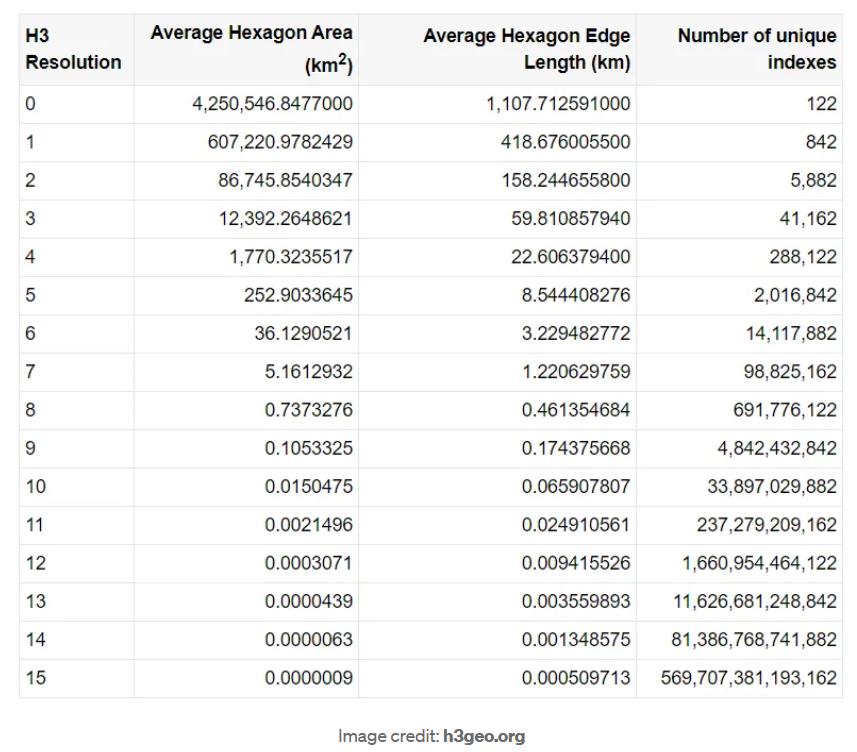

Here, the h3 cell is based on the pickup location of the taxi trip

In [15]:
H3_res = 10

def pgeo_2_h3(row):
  return h3.geo_to_h3(lat=float(row.Pickup_latitude),lng=float(row.Pickup_longitude),resolution = H3_res)

mobility2['h3_cell'] = mobility2.apply(pgeo_2_h3,axis=1)

<ipython-input-15-aac5e3e735c8>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mobility2['h3_cell'] = mobility2.apply(pgeo_2_h3,axis=1)


utilize geo_2_h3 function to sort the coordinates into h3 cells and add the cell id to a new column to the table

In [16]:
mobility2.head()

,id,lpep_pickup_datetime,Lpep_dropoff_datetime,Pickup_latitude,Pickup_longitude,Dropoff_longitude,Dropoff_latitude,Passenger_count,Trip_distance,Total_amount,h3_cell
0,0,2016-01-01 00:29:24,2016-01-01 00:39:36,40.68061065673828,-73.92864227294922,-73.92427825927734,40.69804382324219,1,1.46,11.16,8a2a100d9da7fff
1,1,2016-01-01 00:19:39,2016-01-01 00:39:18,40.723175048828125,-73.95267486572266,-73.92391967773438,40.76137924194336,1,3.56,16.8,8a2a100d17b7fff
2,2,2016-01-01 00:19:33,2016-01-01 00:39:48,40.67610549926758,-73.97161102294922,-74.0131607055664,40.64607238769531,1,3.79,22.25,8a2a100da2d7fff
3,3,2016-01-01 00:22:12,2016-01-01 00:38:32,40.669578552246094,-73.989501953125,-74.00064849853516,40.68903350830078,1,3.01,14.8,8a2a107740b7fff
4,4,2016-01-01 00:24:01,2016-01-01 00:39:22,40.68285369873047,-73.96472930908203,-73.94071960449219,40.66301345825195,1,2.55,13.3,8a2a100da327fff


further summarize the table into the data of concer and the h3 cell only

In [17]:
mobility2 = (mobility2[['id','h3_cell']])
mobility2.head()

,id,h3_cell
0,0,8a2a100d9da7fff
1,1,8a2a100d17b7fff
2,2,8a2a100da2d7fff
3,3,8a2a107740b7fff
4,4,8a2a100da327fff


group all id values belonging to the same h3 cell into a single row

In [18]:
mobility2_g = (mobility2
                          .groupby('h3_cell')
                          .id
                          .agg(list)
                          .to_frame("ids")
                          .reset_index())
# Let's count each points inside the hexagon
mobility2_g['count'] =(mobility2_g['ids']
                      .apply(lambda ignition_ids:len(ignition_ids)))

In [19]:
mobility2_g.sort_values('count',ascending=False)

,h3_cell,ids,count
6681,8a2a100c5adffff,"[62, 71, 314, 347, 351, 923, 1130, 1295, 1432,...",21591
6937,8a2a100c68c7fff,"[45, 136, 147, 337, 362, 428, 471, 593, 626, 7...",16638
3108,8a2a1008d8a7fff,"[663, 788, 1001, 1093, 1156, 1932, 2987, 3115,...",14522
6865,8a2a100c654ffff,"[152, 377, 444, 537, 573, 769, 871, 1065, 1080...",10701
9914,8a2a100da717fff,"[118, 422, 425, 490, 1180, 1867, 2204, 2344, 2...",9322
...,...,...,...
11816,8a2a100e58c7fff,[1401407],1
11811,8a2a100e571ffff,[1372251],1
11808,8a2a100e56c7fff,[1270334],1
11807,8a2a100e56b7fff,[1125879],1


create the mapping information from the h3 cell values to create the hexagon geometry for each cell on the world map

In [20]:
from shapely.geometry import Polygon
def add_geometry(row):
  points = h3.h3_to_geo_boundary(row['h3_cell'], True)
  return Polygon(points)
#Apply function into our dataframe
mobility2_g['geometry'] = (mobility2_g
                                .apply(add_geometry,axis=1))

mobility2_g.head()

,h3_cell,ids,count,geometry
0,8a29868599a7fff,[1212869],1,POLYGON ((-115.17427331137799 36.0107232312606...
1,8a2986b8000ffff,"[1249954, 1259987, 1262978, 1303376, 1364865, ...",7,POLYGON ((-115.17382160699141 36.1148371897820...
2,8a2986b80017fff,"[1220804, 1270389, 1312001, 1380842]",4,POLYGON ((-115.17127415749775 36.1141627656390...
3,8a2986b80057fff,[1441818],1,POLYGON ((-115.17483450971993 36.1157647919035...
4,8a2986b800a7fff,[1316098],1,POLYGON ((-115.16973958208042 36.1144159424465...


In [21]:
!pip3 install geojson

transform the new table into a geojson object

In [22]:
from geojson import Feature, Point, FeatureCollection, Polygon

def hexagons_dataframe_to_geojson(df_hex, hex_id_field,geometry_field, value_field,file_output = None):

    list_features = []

    for i, row in df_hex.iterrows():
        feature = Feature(geometry = row[geometry_field],
                          id = row[hex_id_field],
                          properties = {"value": row[value_field]})
        list_features.append(feature)

    feat_collection = FeatureCollection(list_features)

    if file_output is not None:
        with open(file_output, "w") as f:
            json.dump(feat_collection, f)

    else :
      return feat_collection

geojson_obj = (hexagons_dataframe_to_geojson
                (mobility2_g,
                 hex_id_field='h3_cell',
                 value_field='count',
                 geometry_field='geometry'))

In [23]:
import plotly.express as px


In [24]:
mobility2_g

,h3_cell,ids,count,geometry
0,8a29868599a7fff,[1212869],1,POLYGON ((-115.17427331137799 36.0107232312606...
1,8a2986b8000ffff,"[1249954, 1259987, 1262978, 1303376, 1364865, ...",7,POLYGON ((-115.17382160699141 36.1148371897820...
2,8a2986b80017fff,"[1220804, 1270389, 1312001, 1380842]",4,POLYGON ((-115.17127415749775 36.1141627656390...
3,8a2986b80057fff,[1441818],1,POLYGON ((-115.17483450971993 36.1157647919035...
4,8a2986b800a7fff,[1316098],1,POLYGON ((-115.16973958208042 36.1144159424465...
...,...,...,...,...
19128,8a2aac948447fff,[1110005],1,POLYGON ((-75.30218783261789 40.10910864003563...
19129,8a2aacaf3da7fff,[964484],1,POLYGON ((-75.51834540234962 39.69006826165502...
19130,8a2b8834c6e7fff,[1219444],1,POLYGON ((-74.28548868288235 43.16817968297479...
19131,8a2b890001affff,"[635770, 635820, 635904]",3,POLYGON ((-73.84818066432386 42.69566026568996...


use plotty express to display the results.
(zoom on New York to view the map)
The map shows the count of taxi pickups in a location in NYC

In [25]:
fig = (px.choropleth_mapbox(
                    mobility2_g,
                    geojson=geojson_obj,
                    locations='h3_cell',
                    color='count',
                    color_continuous_scale="Viridis",
                    range_color=(0,mobility2_g['count'].mean()           ),                  mapbox_style='carto-positron',
                    zoom=7,
                    center = {"lat": 65.469211, "lon": -136.713865},
                    opacity=0.7,
                    labels={'count':'# of taxi pickups in location'}))
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Showcase:
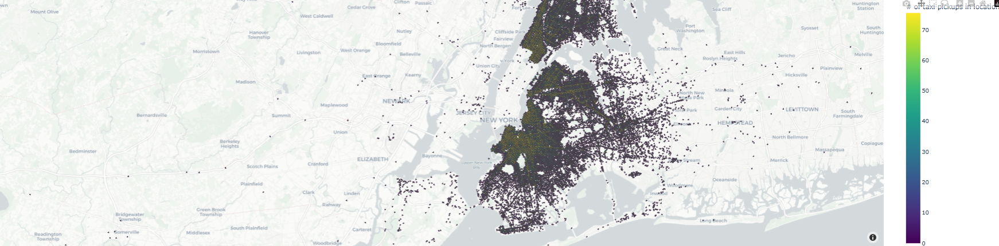

Repeat the process for dropoff locations instead

In [26]:
mobility2 = (mobility[['id', 'lpep_pickup_datetime', 'Lpep_dropoff_datetime', 'Pickup_latitude','Pickup_longitude', 'Dropoff_longitude', 'Dropoff_latitude', 'Passenger_count', 'Trip_distance','Total_amount']])
def dgeo_2_h3(row):
  return h3.geo_to_h3(lat=float(row.Dropoff_latitude),lng=float(row.Dropoff_longitude),resolution = H3_res)

mobility2['h3_cell'] = mobility2.apply(pgeo_2_h3,axis=1)

<ipython-input-26-ab98acd68a3e>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [27]:
mobility2 = (mobility2[['id','h3_cell']])
mobility2.head()

,id,h3_cell
0,0,8a2a100d9da7fff
1,1,8a2a100d17b7fff
2,2,8a2a100da2d7fff
3,3,8a2a107740b7fff
4,4,8a2a100da327fff


In [28]:
mobility2_g = (mobility2
                          .groupby('h3_cell')
                          .id
                          .agg(list)
                          .to_frame("ids")
                          .reset_index())
# Let's count each points inside the hexagon
mobility2_g['count'] =(mobility2_g['ids']
                      .apply(lambda ignition_ids:len(ignition_ids)))

In [29]:
mobility2_g.sort_values('count',ascending=False)

,h3_cell,ids,count
6681,8a2a100c5adffff,"[62, 71, 314, 347, 351, 923, 1130, 1295, 1432,...",21591
6937,8a2a100c68c7fff,"[45, 136, 147, 337, 362, 428, 471, 593, 626, 7...",16638
3108,8a2a1008d8a7fff,"[663, 788, 1001, 1093, 1156, 1932, 2987, 3115,...",14522
6865,8a2a100c654ffff,"[152, 377, 444, 537, 573, 769, 871, 1065, 1080...",10701
9914,8a2a100da717fff,"[118, 422, 425, 490, 1180, 1867, 2204, 2344, 2...",9322
...,...,...,...
11816,8a2a100e58c7fff,[1401407],1
11811,8a2a100e571ffff,[1372251],1
11808,8a2a100e56c7fff,[1270334],1
11807,8a2a100e56b7fff,[1125879],1


In [30]:
from shapely.geometry import Polygon
def add_geometry(row):
  points = h3.h3_to_geo_boundary(row['h3_cell'], True)
  return Polygon(points)
#Apply function into our dataframe
mobility2_g['geometry'] = (mobility2_g
                                .apply(add_geometry,axis=1))

mobility2_g.head()

,h3_cell,ids,count,geometry
0,8a29868599a7fff,[1212869],1,POLYGON ((-115.17427331137799 36.0107232312606...
1,8a2986b8000ffff,"[1249954, 1259987, 1262978, 1303376, 1364865, ...",7,POLYGON ((-115.17382160699141 36.1148371897820...
2,8a2986b80017fff,"[1220804, 1270389, 1312001, 1380842]",4,POLYGON ((-115.17127415749775 36.1141627656390...
3,8a2986b80057fff,[1441818],1,POLYGON ((-115.17483450971993 36.1157647919035...
4,8a2986b800a7fff,[1316098],1,POLYGON ((-115.16973958208042 36.1144159424465...


In [31]:
from geojson import Feature, Point, FeatureCollection, Polygon

def hexagons_dataframe_to_geojson(df_hex, hex_id_field,geometry_field, value_field,file_output = None):

    list_features = []

    for i, row in df_hex.iterrows():
        feature = Feature(geometry = row[geometry_field],
                          id = row[hex_id_field],
                          properties = {"value": row[value_field]})
        list_features.append(feature)

    feat_collection = FeatureCollection(list_features)

    if file_output is not None:
        with open(file_output, "w") as f:
            json.dump(feat_collection, f)

    else :
      return feat_collection

geojson_obj = (hexagons_dataframe_to_geojson
                (mobility2_g,
                 hex_id_field='h3_cell',
                 value_field='count',
                 geometry_field='geometry'))

In [32]:
mobility2_g

,h3_cell,ids,count,geometry
0,8a29868599a7fff,[1212869],1,POLYGON ((-115.17427331137799 36.0107232312606...
1,8a2986b8000ffff,"[1249954, 1259987, 1262978, 1303376, 1364865, ...",7,POLYGON ((-115.17382160699141 36.1148371897820...
2,8a2986b80017fff,"[1220804, 1270389, 1312001, 1380842]",4,POLYGON ((-115.17127415749775 36.1141627656390...
3,8a2986b80057fff,[1441818],1,POLYGON ((-115.17483450971993 36.1157647919035...
4,8a2986b800a7fff,[1316098],1,POLYGON ((-115.16973958208042 36.1144159424465...
...,...,...,...,...
19128,8a2aac948447fff,[1110005],1,POLYGON ((-75.30218783261789 40.10910864003563...
19129,8a2aacaf3da7fff,[964484],1,POLYGON ((-75.51834540234962 39.69006826165502...
19130,8a2b8834c6e7fff,[1219444],1,POLYGON ((-74.28548868288235 43.16817968297479...
19131,8a2b890001affff,"[635770, 635820, 635904]",3,POLYGON ((-73.84818066432386 42.69566026568996...


In [33]:
fig = (px.choropleth_mapbox(
                    mobility2_g,
                    geojson=geojson_obj,
                    locations='h3_cell',
                    color='count',
                    color_continuous_scale="Viridis",
                    range_color=(0,mobility2_g['count'].mean()           ),                  mapbox_style='carto-positron',
                    zoom=7,
                    center = {"lat": 65.469211, "lon": -136.713865},
                    opacity=0.7,
                    labels={'count':'# of taxi dropoff in location'}))
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

showcase:
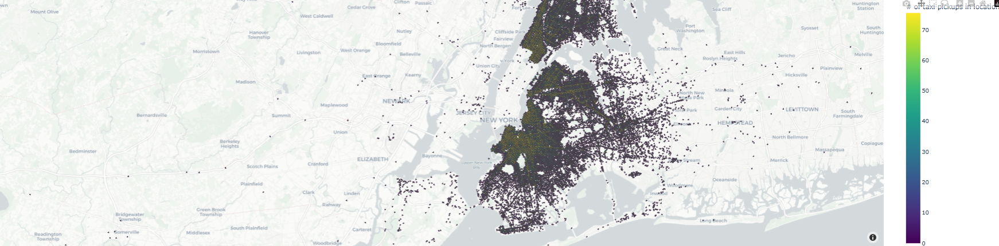